# 1- Data Loading

In [2]:
# pip install segyio numpy matplotlib scipy

## 1.1 -Open a SEGY file

In [4]:
import segyio

segy_file = "Noise_1.sgy"

with segyio.open(segy_file, "r", ignore_geometry=True) as f:
    print("Number of traces:", f.tracecount)
    print("Number of samples per trace:", len(f.samples))
    print("Sample interval (microsec):", segyio.tools.dt(f))


Number of traces: 2000000
Number of samples per trace: 4201
Sample interval (microsec): 2000.0


In [5]:
segy_file_A = "Seismic_A.sgy"

with segyio.open(segy_file_A, "r", ignore_geometry=True) as f:
    print("Number of traces:", f.tracecount)
    print("Number of samples per trace:", len(f.samples))
    print("Sample interval (microsec):", segyio.tools.dt(f))

Number of traces: 933120
Number of samples per trace: 2001
Sample interval (microsec): 4000.0


### 1.1.1 -Open Noise file after match

In [7]:
import segyio

segy_file_A_noisy = "Seismic_A_noisy.sgy"

with segyio.open(segy_file_A_noisy, "r", ignore_geometry=True) as f:
    print("Number of traces:", f.tracecount)
    print("Number of samples per trace:", len(f.samples))
    print("Sample interval (microsec):", segyio.tools.dt(f))

Number of traces: 933120
Number of samples per trace: 4002
Sample interval (microsec): 2000.0


### 1.1.2 -Open Clean data file after match

In [9]:
import segyio

segy_file_AC_clean = "Dataset_Sintetico_07_AC_clean.sgy"

with segyio.open(segy_file_AC_clean, "r", ignore_geometry=True) as f:
    print("Number of traces:", f.tracecount)
    print("Number of samples per trace:", len(f.samples))
    print("Sample interval (microsec):", segyio.tools.dt(f))

Number of traces: 933120
Number of samples per trace: 4002
Sample interval (microsec): 2000.0


## 1.2 - QC Noise_1.sgy

read first 200 traces as one “gather”

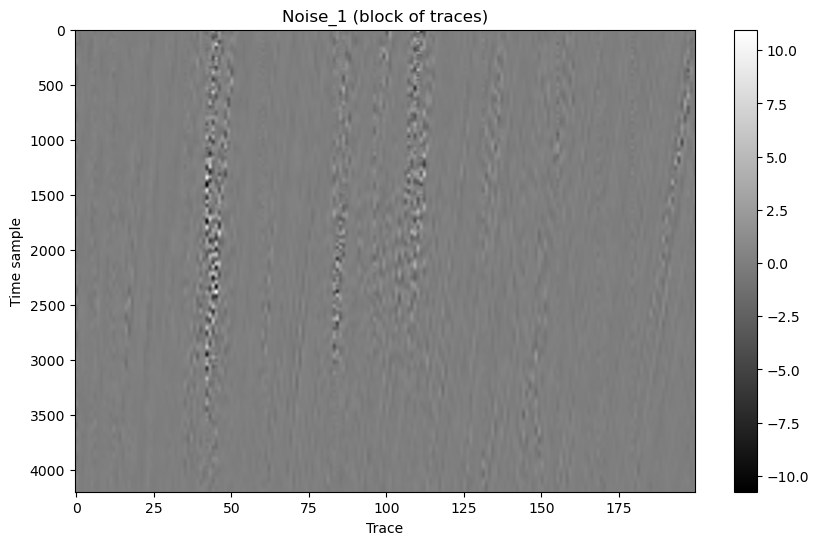

dt (s): 0.002 shape: (200, 4201)


In [11]:
import segyio, numpy as np, matplotlib.pyplot as plt

def read_block(path, start_trace=0, ntr=200):
    with segyio.open(path, "r", ignore_geometry=True) as f:
        ns = len(f.samples)
        dt = segyio.tools.dt(f) / 1e6  # seconds
        block = np.zeros((ntr, ns), dtype=np.float32)
        for i in range(ntr):
            block[i, :] = f.trace[start_trace + i]
    return block, dt

noise, dt = read_block("Noise_1.sgy", start_trace=0, ntr=200)

plt.figure(figsize=(10,6))
plt.imshow(noise.T, cmap="gray", aspect="auto")
plt.title("Noise_1 (block of traces)")
plt.xlabel("Trace")
plt.ylabel("Time sample")
plt.colorbar()
plt.show()

print("dt (s):", dt, "shape:", noise.shape)


## 1.3 -LF spectrum check

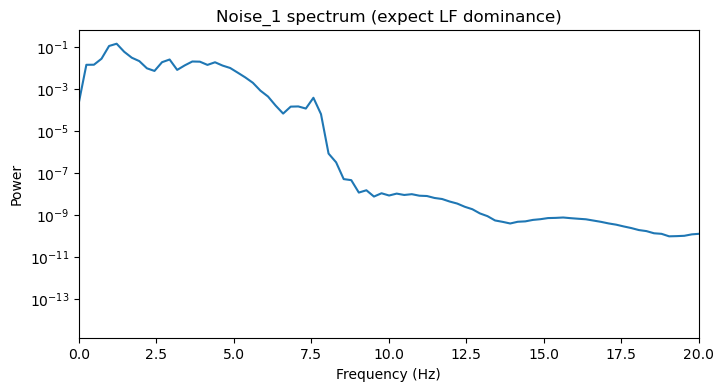

In [13]:
from scipy.signal import welch

tr = noise[noise.shape[0]//2, :]
f, Pxx = welch(tr, fs=1/dt, nperseg=2048)

plt.figure(figsize=(8,4))
plt.semilogy(f, Pxx)
plt.xlim(0, 20)
plt.xlabel("Frequency (Hz)")
plt.ylabel("Power")
plt.title("Noise_1 spectrum (expect LF dominance)")
plt.show()


## 1.4 -QC Seismic_A.sgy (clean-only)

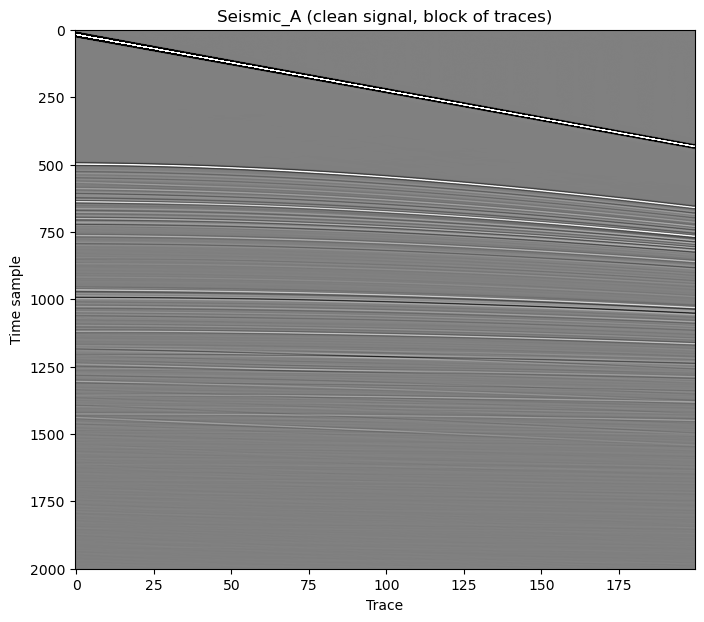

In [15]:
clean, dt2 = read_block("Seismic_A.sgy", start_trace=0, ntr=200)
v = np.percentile(np.abs(clean), 99)

plt.figure(figsize=(8, 7))
plt.imshow(clean.T, cmap="gray", aspect="auto", vmin=-v, vmax=v)
plt.title("Seismic_A (clean signal, block of traces)")
plt.xlabel("Trace")
plt.ylabel("Time sample")
plt.show()


## 1.5 Read a small gather block (same traces)

In [17]:
import numpy as np
import segyio
import matplotlib.pyplot as plt

def read_block(path, start_trace=0, ntr=800):
    with segyio.open(path, "r", ignore_geometry=True) as f:
        ns = len(f.samples)
        block = np.zeros((ntr, ns), dtype=np.float32)
        for i in range(ntr):
            block[i, :] = f.trace[start_trace + i]
    return block

noisy = read_block("Seismic_A_noisy.sgy", start_trace=0, ntr=1300)
clean = read_block("Dataset_Sintetico_07_AC_clean.sgy", start_trace=0, ntr=1300)


## 1.6 Plot clean vs noisy (same clip)

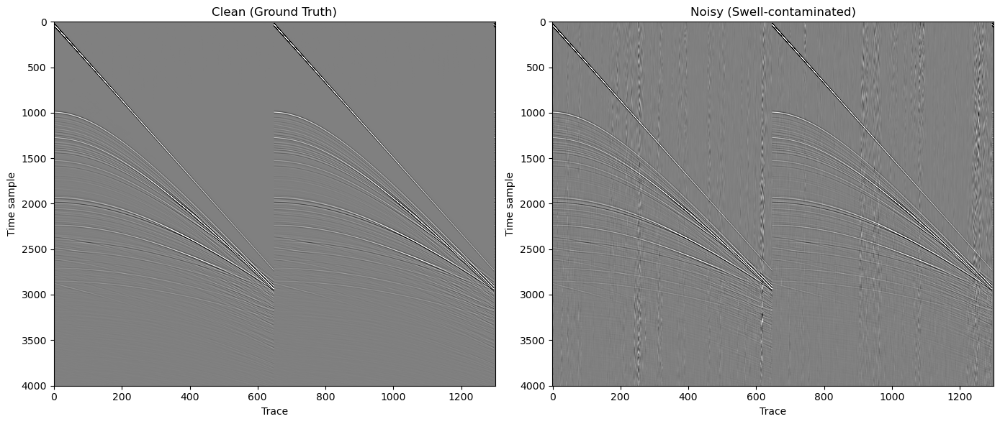

In [19]:
v = np.percentile(np.abs(noisy), 99)

fig, axs = plt.subplots(1, 2, figsize=(14,6))
axs[0].imshow(clean.T, cmap="gray", aspect="auto", vmin=-v, vmax=v)
axs[0].set_title("Clean (Ground Truth)")
axs[1].imshow(noisy.T, cmap="gray", aspect="auto", vmin=-v, vmax=v)
axs[1].set_title("Noisy (Swell-contaminated)")

for ax in axs:
    ax.set_xlabel("Trace")
    ax.set_ylabel("Time sample")

plt.tight_layout()
plt.show()


## 2.1 -Make the LF/HF split

### 2.1.1 - Set dt

In [22]:
dt = 0.002  # seconds


### 2.1.2 - Bandpass function + LF extraction

In [24]:
from scipy.signal import butter, filtfilt

def bandpass(data, dt, fmin, fmax, order=4):
    fs = 1.0 / dt
    nyq = 0.5 * fs
    b, a = butter(order, [fmin/nyq, fmax/nyq], btype='band')
    return filtfilt(b, a, data, axis=1)

noisy_LF = bandpass(noisy, dt, 2.0, 10.0)
noisy_HF = noisy - noisy_LF


### 2.1.3 - Plot only noisy_LF

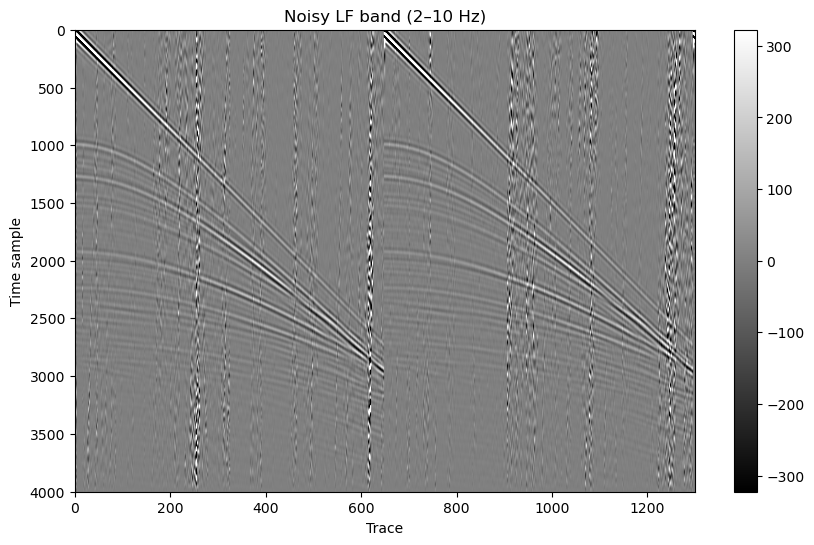

In [26]:
import numpy as np
import matplotlib.pyplot as plt

v = np.percentile(np.abs(noisy_LF), 99)

plt.figure(figsize=(10,6))
plt.imshow(noisy_LF.T, cmap="gray", aspect="auto", vmin=-v, vmax=v)
plt.title("Noisy LF band (2–10 Hz)")
plt.xlabel("Trace")
plt.ylabel("Time sample")
plt.colorbar()
plt.show()


### 2.1.4 - Inspect LF statistics (NO filtering yet)

Is LF noise amplitude stationary, or does it vary strongly with time?

#### one diagnostic plot — RMS vs time for LF.

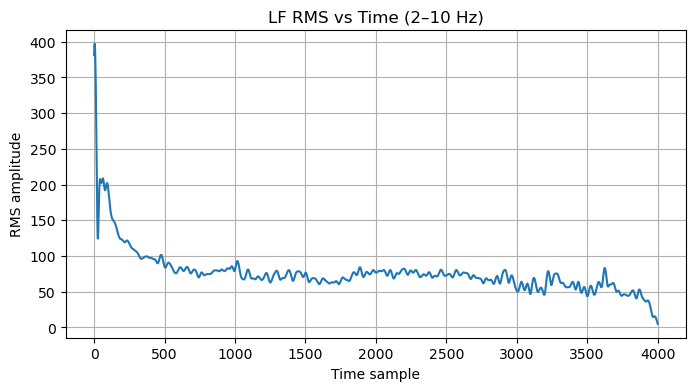

In [29]:
# RMS of LF energy vs time
lf_rms_time = np.sqrt(np.mean(noisy_LF**2, axis=0))

plt.figure(figsize=(8,4))
plt.plot(lf_rms_time)
plt.title("LF RMS vs Time (2–10 Hz)")
plt.xlabel("Time sample")
plt.ylabel("RMS amplitude")
plt.grid(True)
plt.show()


### 2.1.5 -Compute LF for all three

In [31]:
clean_LF = bandpass(clean, dt, 2.0, 10.0)
noisy_LF = bandpass(noisy, dt, 2.0, 10.0)
noise_true = noisy - clean  # derive true noise 
noise_true_LF = bandpass(noise_true, dt, 2.0, 10.0)


### 2.1.6 - RMS vs time for all three

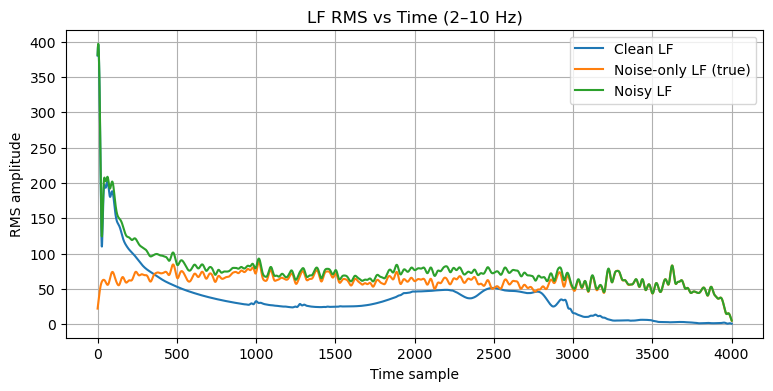

In [33]:
import numpy as np
import matplotlib.pyplot as plt

def rms_time(panel):   # panel shape = (ntr, ns)
    return np.sqrt(np.mean(panel**2, axis=0))

r_clean = rms_time(clean_LF)
r_noise = rms_time(noise_true_LF)
r_noisy = rms_time(noisy_LF)

plt.figure(figsize=(9,4))
plt.plot(r_clean, label="Clean LF")
plt.plot(r_noise, label="Noise-only LF (true)")
plt.plot(r_noisy, label="Noisy LF")
plt.title("LF RMS vs Time (2–10 Hz)")
plt.xlabel("Time sample")
plt.ylabel("RMS amplitude")
plt.grid(True)
plt.legend()
plt.show()


### Key observations

**Early time (top of record)** :

* Clean LF is very strong
* Noise-only LF is much smaller
* Noisy LF ≈ Clean LF + Noise LF

**This is critical**:

Early-time LF is signal-dominated, not noise-dominated.

So:

* Any aggressive LF suppression here will damage signal
* Physics-only median filtering is dangerous at early times

**Mid times (~500–2500 samples)**:

* Clean LF drops significantly
* Noise-only LF becomes comparable to or larger than clean LF
* Noisy LF is clearly noise-influenced

This is the sweet spot for ML:

Noise is significant, but signal still exists.

This is where:

* fixed physics filters struggle
* aptive ML has real value

**Late times (>3000 samples)**:
* Clean LF becomes very weak
* Noise-only LF dominates

Here:
* ML can be aggressive
* Risk of signal damage is low
* Physics baseline often underperforms due to weak SNR

#### The most important conclusion:

**LF noise is NOT uniformly dominant in time.**

Instead:

* Early time → **signal-dominated LF**
* Mid time → **mixed**
* Late time → **noise-dominated LF**

**Now we can refine the ML goal properly.**

**ML should**:
* Learn where noise dominates
* Learn where signal dominates
* Adjust suppression implicitly, not via hard rules

And importantly:
* ML must see time context
* ML must see relative amplitudes
* ML must predict noise, not clean signal

## 3.0 Define a patch extractor for (noisy_LF, noise_LF_true) and visually inspect ONE patch

### 3.1.1 Create LF panels + true LF noise

In [37]:
# 1) LF components
clean_LF = bandpass(clean, dt, 2.0, 10.0)
noisy_LF = bandpass(noisy, dt, 2.0, 10.0)

# 2) True noise (because we have ground truth)
noise_true_LF = noisy_LF - clean_LF


### 3.1.2 Extract ONE patch ( 256 traces × 512 samples)

In [39]:
# Patch size (best-practice starting point)
pt = 512   # time samples
px = 256   # traces

# Pick one patch location (we can change these later)
t0 = 1200    # start time sample
x0 = 200    # start trace

# Slice one patch
noisy_patch = noisy_LF[x0:x0+px, t0:t0+pt]
noise_patch = noise_true_LF[x0:x0+px, t0:t0+pt]
clean_patch = clean_LF[x0:x0+px, t0:t0+pt]

print("Patch shapes:", noisy_patch.shape, noise_patch.shape, clean_patch.shape)


Patch shapes: (256, 512) (256, 512) (256, 512)


### 3.1.3 - Plot the ONE patch (3 panels)

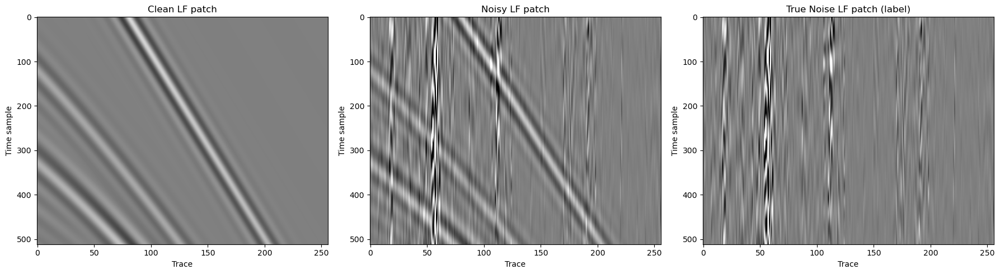

In [41]:
import numpy as np
import matplotlib.pyplot as plt

v = np.percentile(np.abs(noisy_patch), 99)

fig, axs = plt.subplots(1, 3, figsize=(18,5))
axs[0].imshow(clean_patch.T, cmap="gray", aspect="auto", vmin=-v, vmax=v)
axs[0].set_title("Clean LF patch")

axs[1].imshow(noisy_patch.T, cmap="gray", aspect="auto", vmin=-v, vmax=v)
axs[1].set_title("Noisy LF patch")

axs[2].imshow(noise_patch.T, cmap="gray", aspect="auto", vmin=-v, vmax=v)
axs[2].set_title("True Noise LF patch (label)")

for ax in axs:
    ax.set_xlabel("Trace")
    ax.set_ylabel("Time sample")

plt.tight_layout()
plt.show()


## 3.2 - Define a safe patch sampler
* We define a safe patch sampler so that the ML model learns only the physics-consistent noise patterns and is never accidentally trained on artifacts, edges, or misleading examples.
* The sampler defines what the ML model is allowed to learn from.

**The sampler enforces these rules**:
* ML only sees LF (2–10 Hz).So it cannot damage HF signal.
* ML only predicts noise.So it cannot hallucinate geology.
* ML mostly sees mid/deep times.So it doesn’t learn to remove signal-dominated LF.

**This sampler**:
    
* draws random patches
* avoids edges
* samples time from a controlled depth range (reflection-rich)
* returns (input, label) pairs



In [43]:
import numpy as np

def sample_patches(noisy_LF, clean_LF, 
                   n_patches=100,
                   px=256, pt=512,
                   x_stride=None,
                   t_min=800, t_max=3000,
                   seed=42):
    """
    Returns:
      X: noisy LF patches, shape (N, px, pt)
      Y: true noise LF patches, shape (N, px, pt)
    """
    rng = np.random.default_rng(seed)
    ntr, ns = noisy_LF.shape

    # bounds
    max_x0 = ntr - px
    max_t0 = ns - pt

    t_lo = max(t_min, 0)
    t_hi = min(t_max, max_t0)

    X = np.zeros((n_patches, px, pt), dtype=np.float32)
    Y = np.zeros((n_patches, px, pt), dtype=np.float32)

    for i in range(n_patches):
        x0 = rng.integers(0, max_x0 + 1)
        t0 = rng.integers(t_lo, t_hi + 1)

        noisy_patch = noisy_LF[x0:x0+px, t0:t0+pt]
        clean_patch = clean_LF[x0:x0+px, t0:t0+pt]

        X[i] = noisy_patch
        Y[i] = noisy_patch - clean_patch  # true LF noise

    return X, Y


##  3.3 — Split gathers into TRAIN and TEST

In [45]:
# ---------------------------------------
# Step 3.3: Train / Test split (by traces)
# ---------------------------------------

def split_gathers(noisy, clean, train_frac=0.8):
    ntr = noisy.shape[0]
    split = int(train_frac * ntr)

    noisy_train = noisy[:split, :].astype("float32")
    clean_train = clean[:split, :].astype("float32")

    noisy_test  = noisy[split:, :].astype("float32")
    clean_test  = clean[split:, :].astype("float32")

    return noisy_train, clean_train, noisy_test, clean_test


noisy_train, clean_train, noisy_test, clean_test = split_gathers(noisy, clean)

print("TRAIN gathers:", noisy_train.shape, clean_train.shape)
print("TEST  gathers:", noisy_test.shape,  clean_test.shape)


TRAIN gathers: (1040, 4002) (1040, 4002)
TEST  gathers: (260, 4002) (260, 4002)


### 3.3.2 — Visual QC of the split

**Side by Side Display**

In [230]:
import numpy as np
import matplotlib.pyplot as plt

def show_gathers_side_by_side(gathers, titles, pct=99, save_path=None):
    assert len(gathers) == len(titles), "gathers and titles must have same length"

    # Shared clip
    all_data = np.concatenate([g.ravel() for g in gathers])
    v = np.percentile(np.abs(all_data), pct)
    if v == 0:
        v = 1.0

    n = len(gathers)
    fig, axs = plt.subplots(1, n, figsize=(5*n, 6), sharey=True)

    if n == 1:
        axs = [axs]

    for ax, g, title in zip(axs, gathers, titles):
        ax.imshow(
            g.T,
            cmap="gray",
            aspect="auto",
            vmin=-v,
            vmax=v
        )
        ax.set_title(title)
        ax.set_xlabel("Trace")

    axs[0].set_ylabel("Time sample")
    plt.tight_layout()

    if save_path is not None:
        plt.savefig(save_path, dpi=200, bbox_inches="tight")

    plt.show()




**Individual Display**

In [50]:
def show_gather(g, title="", pct=99, save_path=None):
    v = np.percentile(np.abs(g), pct)

    plt.figure(figsize=(6, 4))
    plt.imshow(g.T, cmap="gray", aspect="auto", vmin=-v, vmax=v)
    plt.title(title)
    plt.xlabel("Trace")
    plt.ylabel("Time sample")
    plt.tight_layout()

    if save_path is not None:
        plt.savefig(save_path, dpi=200, bbox_inches="tight")

    plt.show()


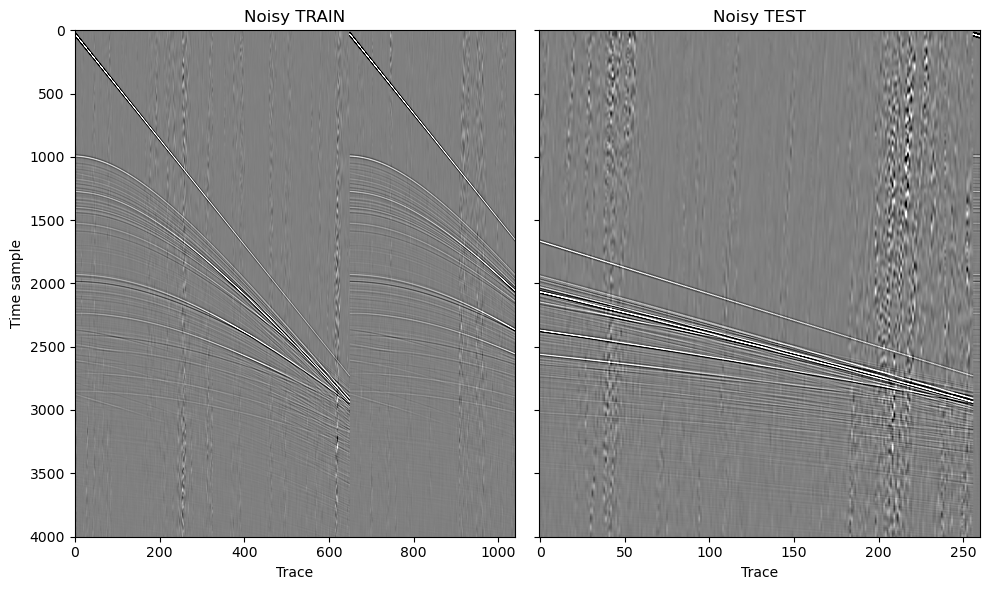

In [51]:
show_gathers_side_by_side(
    [noisy_train, noisy_test],
    ["Noisy TRAIN", "Noisy TEST"]
)


### 3.4 — Create LF versions (TRAIN + TEST)

Lets do this on full gathers, not patches.

### 3.4.1 - Define LF filter (time domain, zero-phase)

In [54]:
from scipy.signal import butter, filtfilt

def lowpass_time(data, dt, fcut, order=4):
    """
    data: (ntr, ns)
    dt:   sample interval (s)
    fcut: cutoff frequency (Hz)
    """
    nyq = 0.5 / dt
    b, a = butter(order, fcut / nyq, btype="low")
    return filtfilt(b, a, data, axis=1)


### 3.4.2 Apply LF filter to TRAIN and TEST targets

In [56]:
dt = 0.004     # <-- confirm this is correct for your data
fcut = 5.0     # conservative swell band

# true noise (full band)
noise_train = noisy_train - clean_train
noise_test  = noisy_test  - clean_test

# LF-only noise (training target)
noise_train_LF = lowpass_time(noise_train, dt, fcut)
noise_test_LF  = lowpass_time(noise_test,  dt, fcut)


### 3.4.3 Visual QC


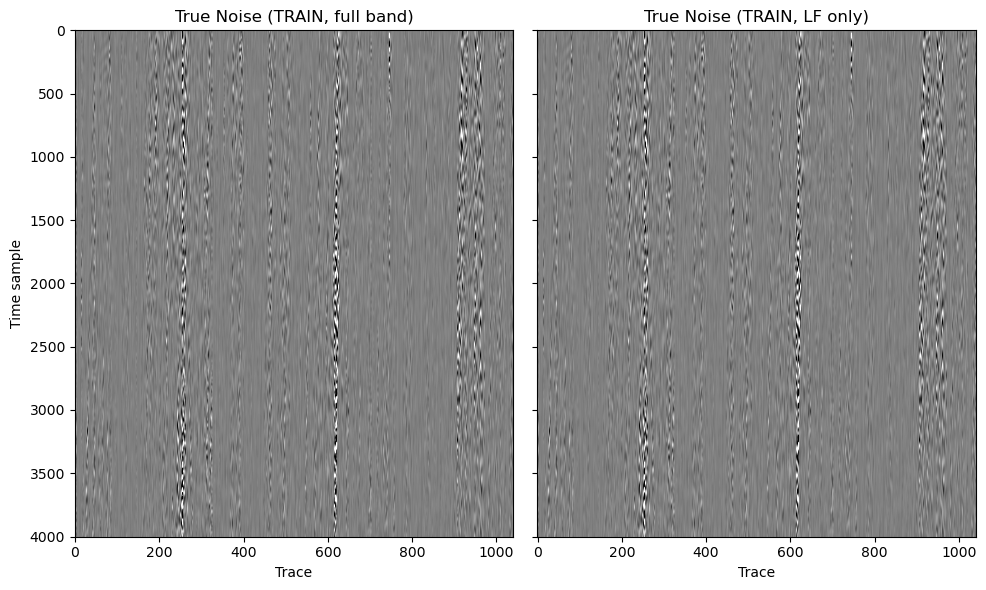

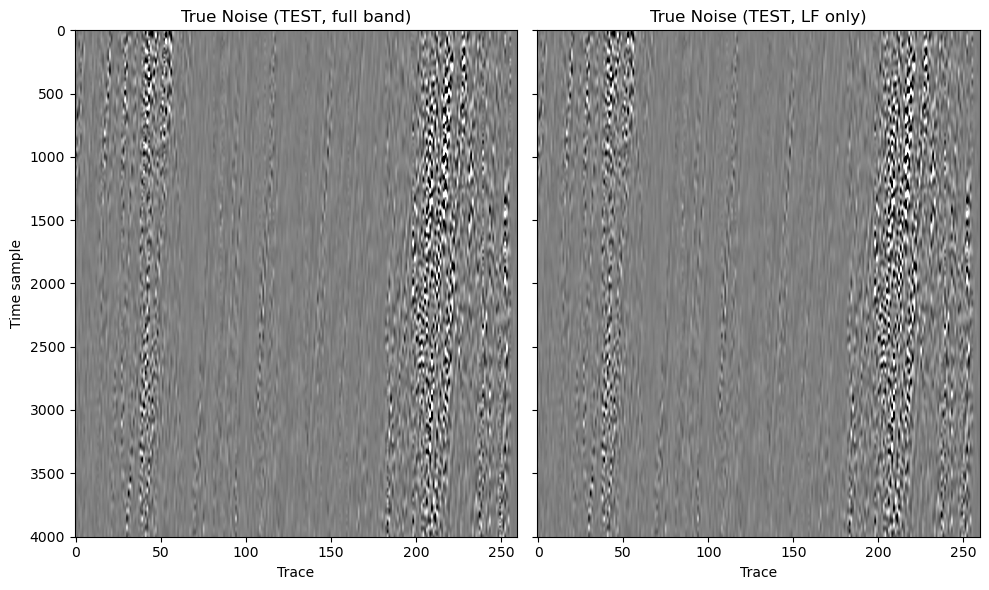

In [58]:
show_gathers_side_by_side(
    [noise_train,  noise_train_LF],
    ["True Noise (TRAIN, full band)", "True Noise (TRAIN, LF only)"]
)

show_gathers_side_by_side(
    [ noise_test,noise_test_LF],
    [ "True Noise (TEST, full band)","True Noise (TEST, LF only)"]
)

## 3.5-TRAIN-only LF patch sampling

### 3.5.1- Define LF INPUT

In [61]:
# Step 3.5.1 — LF input for ML (TRAIN only)

noisy_train_LF = lowpass_time(noisy_train, dt, fcut)

# Optional but highly recommended for QC only
clean_train_LF = lowpass_time(clean_train, dt, fcut)


#### Visual QC

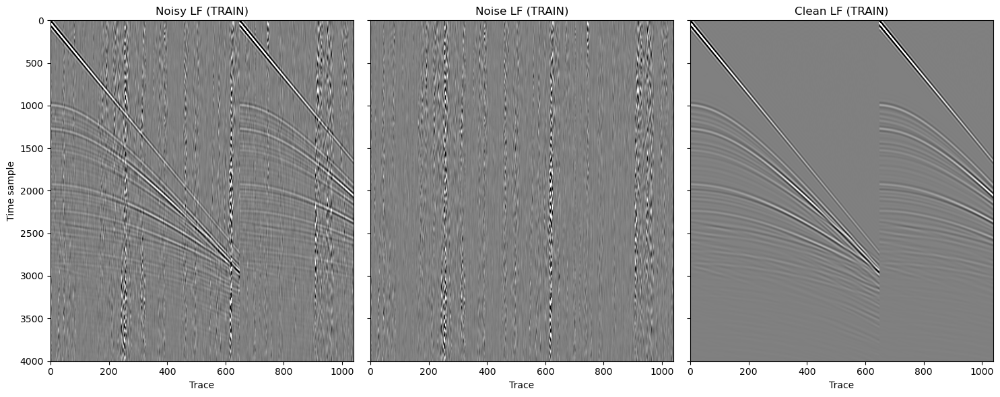

In [63]:
show_gathers_side_by_side(
    [noisy_train_LF,  noise_train_LF,clean_train_LF],
    ["Noisy LF (TRAIN)", "Noise LF (TRAIN)", "Clean LF (TRAIN)"]
)

### 3.5.2 — Define patch geometry + safe time window

In [65]:
# Step 3.5.2 — Patch geometry + safe sampling window (TRAIN only)

# Patch size (same as earlier)
px = 256   # traces
pt = 512   # time samples

# Edge safety (avoid boundary artifacts)
edge_x = 16
edge_t = 16

# Safe time window
# Rationale from your notes:
# - Early time LF is signal-dominated (don't train there)
# - Mid/Late time is mixed/noise-dominant (train there)
t_min = 800     # start sample (adjust if needed)
t_max = 3000    # end sample   (adjust if needed)

# Quick sanity checks
nx, nt = noisy_train_LF.shape
print("noisy_train_LF shape:", (nx, nt))
print("x0 valid range:", edge_x, "to", nx - px - edge_x)
print("t0 valid range:", max(t_min, edge_t), "to", min(t_max, nt - pt - edge_t))

assert nx - px - edge_x > edge_x, "Patch too wide for gather width"
assert min(t_max, nt - pt - edge_t) > max(t_min, edge_t), "Time window too small for pt"


noisy_train_LF shape: (1040, 4002)
x0 valid range: 16 to 768
t0 valid range: 800 to 3000


### 3.5.3 — Single random patch extraction

In [67]:
# Step 3.5.3 — Extract ONE random TRAIN patch (manual QC)

import numpy as np
import matplotlib.pyplot as plt

rng = np.random.default_rng(123)

x0 = rng.integers(edge_x, nx - px - edge_x)
t0 = rng.integers(max(t_min, edge_t), min(t_max, nt - pt - edge_t))

print("Selected patch origin:", x0, t0)

noisy_patch = noisy_train_LF[x0:x0+px, t0:t0+pt]
noise_patch = noise_train_LF[x0:x0+px, t0:t0+pt]
clean_patch = clean_train_LF[x0:x0+px, t0:t0+pt]


Selected patch origin: 27 2301


#### Visual QC

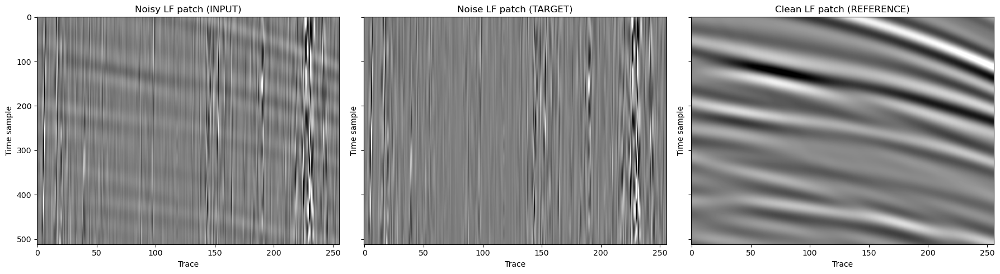

In [69]:
import numpy as np
import matplotlib.pyplot as plt

def show_patch(ax, patch, title, pclip=99.5):
    vmax = np.percentile(np.abs(patch), pclip)
    if vmax == 0:
        vmax = 1.0
    ax.imshow(
        patch.T,
        cmap="gray",
        aspect="auto",
        vmin=-vmax,
        vmax=vmax
    )
    ax.set_title(title)
    ax.set_xlabel("Trace")
    ax.set_ylabel("Time sample")

fig, axs = plt.subplots(1, 3, figsize=(18, 5), sharey=True)

show_patch(axs[0], noisy_patch, "Noisy LF patch (INPUT)")
show_patch(axs[1], noise_patch, "Noise LF patch (TARGET)")
show_patch(axs[2], clean_patch, "Clean LF patch (REFERENCE)")

plt.tight_layout()
plt.show()



### 3.5.4 — Build TRAIN patch index

In [71]:
# Step 3.5.4 — Build TRAIN patch index (no data yet)

n_patches = 3000   # start reasonable; can scale later
patch_index = []

rng = np.random.default_rng(42)

while len(patch_index) < n_patches:
    x0 = rng.integers(edge_x, nx - px - edge_x)
    t0 = rng.integers(max(t_min, edge_t), min(t_max, nt - pt - edge_t))
    patch_index.append((x0, t0))

print("Total TRAIN patch indices:", len(patch_index))
print("First 5 patch indices:", patch_index[:5])


Total TRAIN patch indices: 3000
First 5 patch indices: [(83, 2502), (508, 1765), (341, 2688), (80, 2334), (167, 1007)]


#### QC -A: Shape & bounds sanity (quick, non-visual)

In [73]:
# QC-A: bounds check for a few indices
for i, (x0, t0) in enumerate(patch_index[:5]):
    assert x0 >= edge_x
    assert x0 + px <= nx - edge_x
    assert t0 >= max(t_min, edge_t)
    assert t0 + pt <= nt - edge_t

print("QC-A passed: index bounds OK")


QC-A passed: index bounds OK


#### QC-B: Visual QC of a few indexed patches

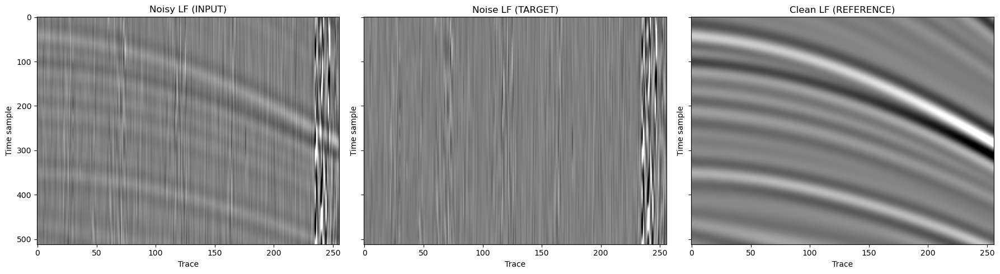

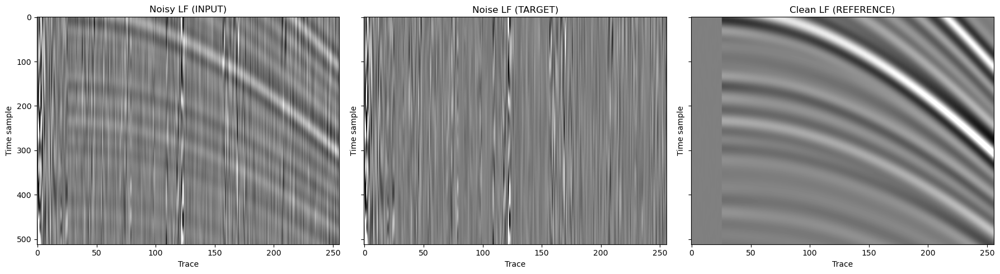

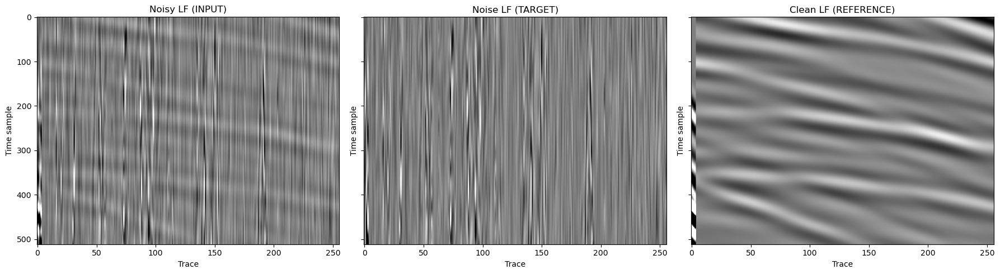

In [75]:
# QC-B: visual check of 3 random indexed patches
for idx in rng.choice(len(patch_index), size=3, replace=False):
    x0, t0 = patch_index[idx]

    noisy_patch = noisy_train_LF[x0:x0+px, t0:t0+pt]
    noise_patch = noise_train_LF[x0:x0+px, t0:t0+pt]
    clean_patch = clean_train_LF[x0:x0+px, t0:t0+pt]

    fig, axs = plt.subplots(1, 3, figsize=(18, 5), sharey=True)
    show_patch(axs[0], noisy_patch, "Noisy LF (INPUT)")
    show_patch(axs[1], noise_patch, "Noise LF (TARGET)")
    show_patch(axs[2], clean_patch, "Clean LF (REFERENCE)")
    plt.tight_layout()
    plt.show()


### 3.5.5 - Convert QC-approved patch_index into actual data arrays.

In [77]:
# Step 3.5.5 — Materialize TRAIN tensors (from QC-approved patch_index)

n_patches = len(patch_index)

X_train_LF = np.zeros((n_patches, px, pt), dtype=np.float32)
Y_train_LF = np.zeros((n_patches, px, pt), dtype=np.float32)

for i, (x0, t0) in enumerate(patch_index):
    X_train_LF[i] = noisy_train_LF[x0:x0+px, t0:t0+pt]
    Y_train_LF[i] = noise_train_LF[x0:x0+px, t0:t0+pt]

print("X_train_LF shape:", X_train_LF.shape)
print("Y_train_LF shape:", Y_train_LF.shape)


X_train_LF shape: (3000, 256, 512)
Y_train_LF shape: (3000, 256, 512)


#### QC

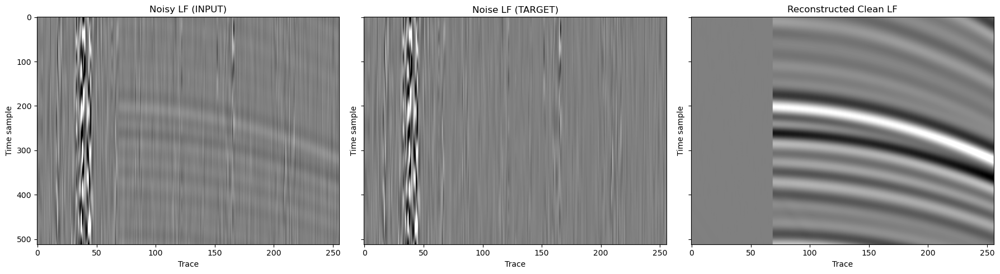

In [79]:
# Minimal QC: check one random sample
i = np.random.randint(n_patches)

fig, axs = plt.subplots(1, 3, figsize=(18, 5), sharey=True)
show_patch(axs[0], X_train_LF[i], "Noisy LF (INPUT)")
show_patch(axs[1], Y_train_LF[i], "Noise LF (TARGET)")
show_patch(axs[2], X_train_LF[i] - Y_train_LF[i], "Reconstructed Clean LF")
plt.tight_layout()
plt.show()


## 3.6 — Patch QC / rejection


We only want to:

* Catch obviously bad patches
* Avoid dipping / coherent signal leakage
* Keep >90% of patches

### 3.6.1 — Define ONE simple metric: lateral coherence

* LF swell noise → low lateral coherence
* Signal leakage → high lateral coherence

In [83]:
# Step 3.6.1 — Lateral coherence metric (very conservative)

def lateral_coherence(patch):
    """
    patch shape: (px, pt)
    returns: mean correlation between adjacent traces
    """
    corrs = []
    for i in range(patch.shape[0] - 1):
        a = patch[i]
        b = patch[i + 1]

        # avoid degenerate cases
        if np.std(a) == 0 or np.std(b) == 0:
            continue

        c = np.corrcoef(a, b)[0, 1]
        corrs.append(c)

    if len(corrs) == 0:
        return 0.0

    return np.mean(corrs)


### 3.6.2 — Measure this metric on ALL TRAIN patches

In [85]:
# Step 3.6.2 — Compute coherence for all TRAIN patches

coh_values = np.zeros(len(Y_train_LF))

for i in range(len(Y_train_LF)):
    coh_values[i] = lateral_coherence(Y_train_LF[i])

print("Coherence stats:")
print("  min :", coh_values.min())
print("  mean:", coh_values.mean())
print("  max :", coh_values.max())


Coherence stats:
  min : -0.3167161260995711
  mean: -0.2420282188954148
  max : -0.16034761519408686


### 3.6.3 — Visualize distribution (ONE plot)

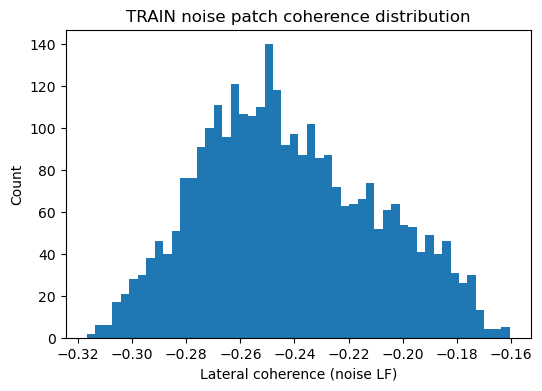

In [87]:
plt.figure(figsize=(6, 4))
plt.hist(coh_values, bins=50)
plt.xlabel("Lateral coherence (noise LF)")
plt.ylabel("Count")
plt.title("TRAIN noise patch coherence distribution")
plt.show()


### 3.6.4 — Convert to absolute coherence

Abs coherence stats:
  min : 0.16034761519408686
  mean: 0.2420282188954148
  max : 0.3167161260995711


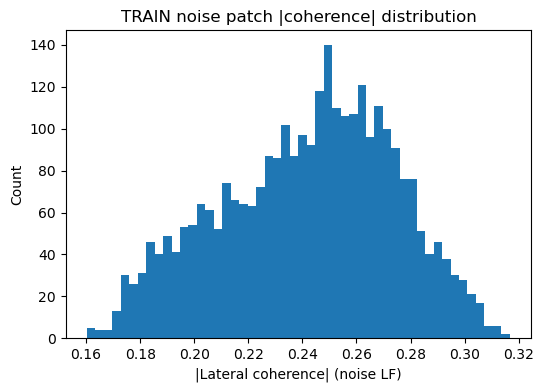

In [89]:
# Step 3.6.4 — Absolute lateral coherence (sign-independent)

abs_coh = np.abs(coh_values)

print("Abs coherence stats:")
print("  min :", abs_coh.min())
print("  mean:", abs_coh.mean())
print("  max :", abs_coh.max())

plt.figure(figsize=(6, 4))
plt.hist(abs_coh, bins=50)
plt.xlabel("|Lateral coherence| (noise LF)")
plt.ylabel("Count")
plt.title("TRAIN noise patch |coherence| distribution")
plt.show()


### 3.6.5 — Define ONE conservative rejection threshold

In [91]:
# Step 3.6.5 — Conservative coherence threshold

mu = abs_coh.mean()
sigma = abs_coh.std()

coh_thresh = mu + 2.0 * sigma

print("Coherence threshold:", coh_thresh)
print("Max coherence:", abs_coh.max())
print("Fraction rejected:", np.mean(abs_coh > coh_thresh))


Coherence threshold: 0.30632511321299616
Max coherence: 0.3167161260995711
Fraction rejected: 0.006333333333333333


### 3.6.6 — Visual QC of rejected patches only

Number of rejected patches: 19


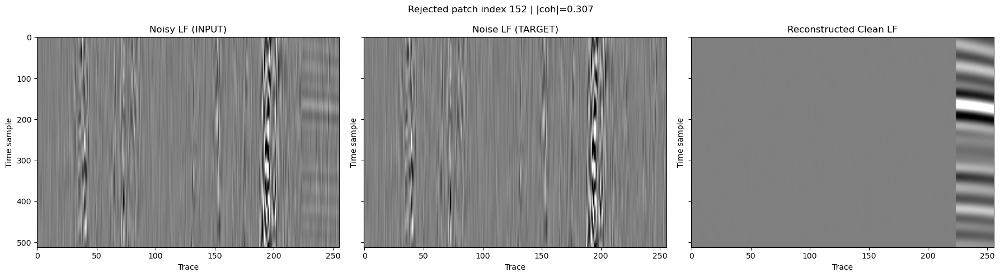

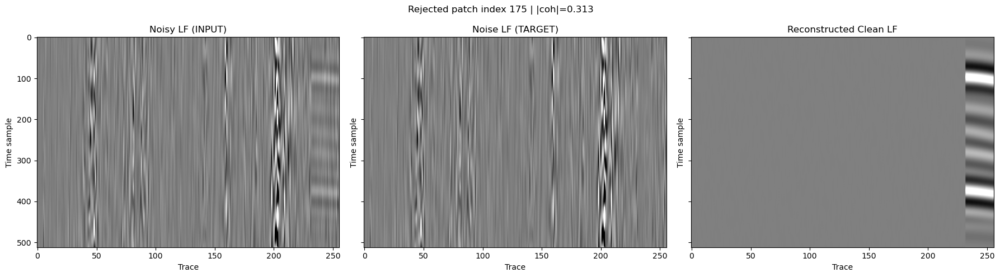

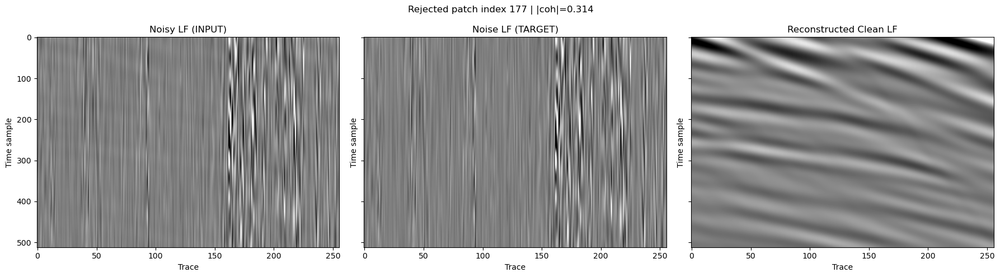

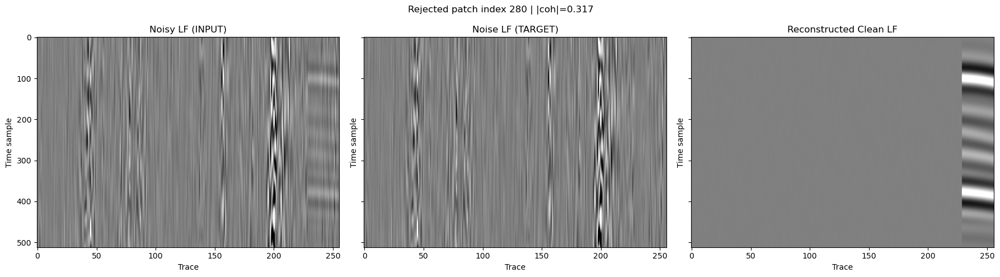

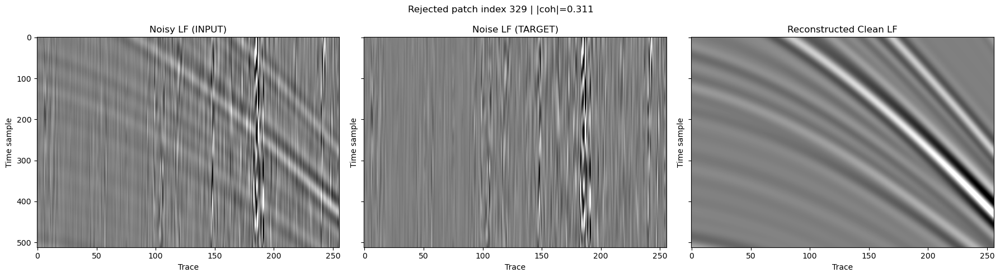

In [93]:
# Step 3.6.6 — Visual QC of rejected patches ONLY

rejected_idx = np.where(abs_coh > coh_thresh)[0]

print("Number of rejected patches:", len(rejected_idx))

# Visually inspect up to 5 rejected patches
n_show = min(5, len(rejected_idx))

for i in rejected_idx[:n_show]:
    fig, axs = plt.subplots(1, 3, figsize=(18, 5), sharey=True)

    show_patch(axs[0], X_train_LF[i], "Noisy LF (INPUT)")
    show_patch(axs[1], Y_train_LF[i], "Noise LF (TARGET)")
    show_patch(axs[2], X_train_LF[i] - Y_train_LF[i], "Reconstructed Clean LF")

    plt.suptitle(f"Rejected patch index {i} | |coh|={abs_coh[i]:.3f}")
    plt.tight_layout()
    plt.show()


### 3.6.7 — Apply rejection

In [95]:
# Step 3.6.7 — Apply conservative rejection

keep_mask = abs_coh <= coh_thresh

X_train_LF_qc = X_train_LF[keep_mask]
Y_train_LF_qc = Y_train_LF[keep_mask]

print("Original patches :", len(X_train_LF))
print("Kept patches     :", len(X_train_LF_qc))
print("Rejected patches :", len(X_train_LF) - len(X_train_LF_qc))


Original patches : 3000
Kept patches     : 2981
Rejected patches : 19


#### QC 

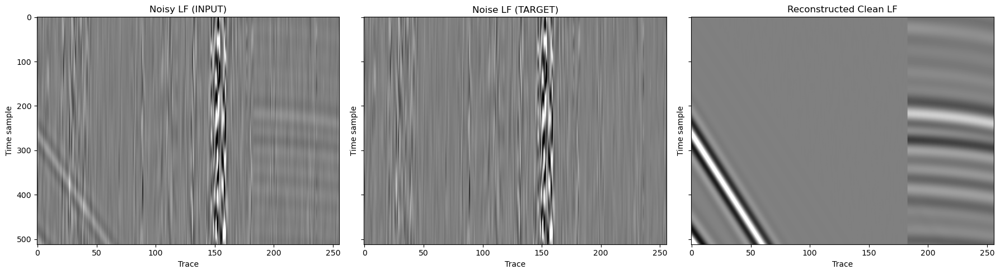

In [97]:
i = np.random.randint(len(X_train_LF_qc))

fig, axs = plt.subplots(1, 3, figsize=(18, 5), sharey=True)
show_patch(axs[0], X_train_LF_qc[i], "Noisy LF (INPUT)")
show_patch(axs[1], Y_train_LF_qc[i], "Noise LF (TARGET)")
show_patch(axs[2], X_train_LF_qc[i] - Y_train_LF_qc[i], "Reconstructed Clean LF")
plt.tight_layout()
plt.show()


## 4 — Model Training

* Predict LF noise, not clean signal
* Stay in LF band only
* Start with the simplest model that can possibly work


### 4.1 — Define TRAIN / VAL split

Split by patch index, not randomly every epoch.

In [100]:
# Step 4.1 — TRAIN / VAL split (patch-based)

n_samples = len(X_train_LF_qc)
val_frac = 0.2

rng = np.random.default_rng(123)
perm = rng.permutation(n_samples)

n_val = int(val_frac * n_samples)
val_idx = perm[:n_val]
train_idx = perm[n_val:]

X_tr = X_train_LF_qc[train_idx]
Y_tr = Y_train_LF_qc[train_idx]

X_val = X_train_LF_qc[val_idx]
Y_val = Y_train_LF_qc[val_idx]

print("Train samples:", X_tr.shape[0])
print("Val samples  :", X_val.shape[0])


Train samples: 2385
Val samples  : 596


### 4.2 — Define the simplest possible model
Can a small spatial filter learn LF swell statistics?

In [102]:
import torch
import torch.nn as nn

class LFNoiseCNN(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(1, 8, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(8, 8, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(8, 1, kernel_size=3, padding=1)
        )

    def forward(self, x):
        return self.net(x)


#### QC

In [104]:
model = LFNoiseCNN()
x_test = torch.randn(1, 1, px, pt)
y_test = model(x_test)
print("Input shape :", x_test.shape)
print("Output shape:", y_test.shape)


Input shape : torch.Size([1, 1, 256, 512])
Output shape: torch.Size([1, 1, 256, 512])


### 4.3 — Loss function

Plain MSE on LF noise

In [106]:
criterion = nn.MSELoss()


### 4.4 — Data loader

**Convert numpy → torch**

In [109]:
def to_tensor(x):
    return torch.from_numpy(x).float().unsqueeze(1)

X_tr_t = to_tensor(X_tr)
Y_tr_t = to_tensor(Y_tr)
X_val_t = to_tensor(X_val)
Y_val_t = to_tensor(Y_val)

print(X_tr_t.shape, Y_tr_t.shape)


torch.Size([2385, 1, 256, 512]) torch.Size([2385, 1, 256, 512])


### 4.5 — ONE sanity training step

This is not training yet. Just checking nothing explodes.

In [111]:
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

model.train()
optimizer.zero_grad()

y_pred = model(X_tr_t[:2])
loss = criterion(y_pred, Y_tr_t[:2])

loss.backward()
optimizer.step()

print("Sanity loss:", loss.item())


Sanity loss: 6608.81591796875


### 4.6 — Baseline training loop

We’ll now train just enough to see if:

* Loss decreases
* Model does something non-random
* No signal leakage appears

This is not production training.
This is a diagnostic run.

In [113]:
# Step 4.6 — Minimal baseline training (diagnostic)

n_epochs = 5
batch_size = 4   # small on purpose

model.train()

train_losses = []
val_losses = []

for epoch in range(n_epochs):
    perm = torch.randperm(X_tr_t.shape[0])
    epoch_loss = 0.0

    for i in range(0, X_tr_t.shape[0], batch_size):
        idx = perm[i:i+batch_size]
        xb = X_tr_t[idx]
        yb = Y_tr_t[idx]

        optimizer.zero_grad()
        y_pred = model(xb)
        loss = criterion(y_pred, yb)
        loss.backward()
        optimizer.step()

        epoch_loss += loss.item()

    epoch_loss /= (X_tr_t.shape[0] // batch_size)
    train_losses.append(epoch_loss)

    # Validation
    model.eval()
    with torch.no_grad():
        yv = model(X_val_t)
        vloss = criterion(yv, Y_val_t).item()
        val_losses.append(vloss)

    model.train()

    print(f"Epoch {epoch+1}: train={epoch_loss:.2f}, val={vloss:.2f}")


Epoch 1: train=607.51, val=245.88
Epoch 2: train=222.38, val=206.21
Epoch 3: train=189.15, val=174.54
Epoch 4: train=174.02, val=166.27
Epoch 5: train=164.81, val=163.02


### 4.7 — Visual QC on validation patch

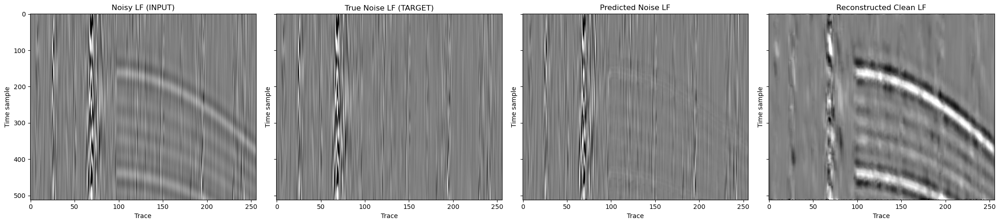

In [115]:
# Step 4.7 — Visual QC on validation patch

model.eval()

i = np.random.randint(X_val_t.shape[0])

with torch.no_grad():
    noise_pred = model(X_val_t[i:i+1]).cpu().numpy()[0, 0]

noisy_in = X_val[i]
noise_true = Y_val[i]
clean_rec = noisy_in - noise_pred

fig, axs = plt.subplots(1, 4, figsize=(22, 5), sharey=True)

show_patch(axs[0], noisy_in, "Noisy LF (INPUT)")
show_patch(axs[1], noise_true, "True Noise LF (TARGET)")
show_patch(axs[2], noise_pred, "Predicted Noise LF")
show_patch(axs[3], clean_rec, "Reconstructed Clean LF")

plt.tight_layout()
plt.show()


## 4.8 — Controlled extended training

We will:

* Train longer
* Watch validation



In [117]:
# Step 4.8 — Extended baseline training

n_epochs = 15
batch_size = 4

train_losses = []
val_losses = []

for epoch in range(n_epochs):
    perm = torch.randperm(X_tr_t.shape[0])
    epoch_loss = 0.0

    model.train()
    for i in range(0, X_tr_t.shape[0], batch_size):
        idx = perm[i:i+batch_size]
        xb = X_tr_t[idx]
        yb = Y_tr_t[idx]

        optimizer.zero_grad()
        y_pred = model(xb)
        loss = criterion(y_pred, yb)
        loss.backward()
        optimizer.step()

        epoch_loss += loss.item()

    epoch_loss /= (X_tr_t.shape[0] // batch_size)
    train_losses.append(epoch_loss)

    model.eval()
    with torch.no_grad():
        vloss = criterion(model(X_val_t), Y_val_t).item()
        val_losses.append(vloss)

    print(f"Epoch {epoch+1:02d}: train={epoch_loss:.2f}, val={vloss:.2f}")

    # Optional early stop
    if epoch > 10 and vloss > min(val_losses[:-1]) * 1.02:
        print("Early stopping triggered")
        break


Epoch 01: train=159.21, val=154.41
Epoch 02: train=154.10, val=150.92
Epoch 03: train=150.95, val=143.49
Epoch 04: train=146.56, val=141.54
Epoch 05: train=142.65, val=140.13
Epoch 06: train=138.55, val=135.87
Epoch 07: train=135.26, val=131.69
Epoch 08: train=132.16, val=127.26
Epoch 09: train=128.20, val=124.45
Epoch 10: train=125.86, val=122.04
Epoch 11: train=122.98, val=119.83
Epoch 12: train=120.67, val=116.26
Epoch 13: train=118.28, val=115.22
Epoch 14: train=116.09, val=113.33
Epoch 15: train=114.84, val=111.51


### 4.9 — Final visual QC

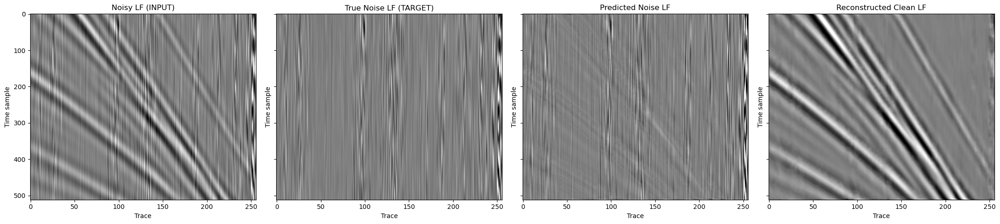

In [119]:
# Step 4.9 — Final visual QC after extended training

model.eval()

i = np.random.randint(X_val_t.shape[0])

with torch.no_grad():
    noise_pred = model(X_val_t[i:i+1]).cpu().numpy()[0, 0]

noisy_in = X_val[i]
noise_true = Y_val[i]
clean_rec = noisy_in - noise_pred

fig, axs = plt.subplots(1, 4, figsize=(22, 5), sharey=True)

show_patch(axs[0], noisy_in, "Noisy LF (INPUT)")
show_patch(axs[1], noise_true, "True Noise LF (TARGET)")
show_patch(axs[2], noise_pred, "Predicted Noise LF")
show_patch(axs[3], clean_rec, "Reconstructed Clean LF")

plt.tight_layout()
plt.show()


## 5 — Final validation on untouched full gathers

Even though the model was trained on LF-only patches, the final application must be:

* Applied to LF-filtered full gather
* Predicted LF noise
* Subtracted from LF noisy
* Then merged back with original broadband data

We do NOT let the model see broadband data directly.

### 5.1 — Save the trained model

In [122]:
# Step 5.1 — Save baseline model

model_path = "lf_noise_cnn_baseline.pt"

torch.save({
    "model_state_dict": model.state_dict(),
    "px": px,
    "pt": pt,
    "fcut": fcut,
    "dt": dt
}, model_path)

print("Model saved to:", model_path)


Model saved to: lf_noise_cnn_baseline.pt


### 5.2 — Prepare untouched validation gather

#### LF decomposition

In [125]:
# Step 5.2 — LF preparation for full gather (untouched data)

noisy_full = noisy_test        # untouched gather
clean_full = clean_test        # optional, for validation only

noisy_full_LF = lowpass_time(noisy_full, dt, fcut)
clean_full_LF = lowpass_time(clean_full, dt, fcut)


### 5.3 — Sliding-window inference on full gather

We apply the model patch-by-patch, then overlap-average

#### Initialize prediction buffer

In [128]:
# Step 5.3 — Sliding-window LF noise prediction

nx, nt = noisy_full_LF.shape

noise_pred_LF = np.zeros_like(noisy_full_LF)
weight = np.zeros_like(noisy_full_LF)

stride_x = px // 2
stride_t = pt // 2


#### Inference loop

In [130]:
model.eval()

with torch.no_grad():
    for x0 in range(0, nx - px + 1, stride_x):
        for t0 in range(0, nt - pt + 1, stride_t):

            patch = noisy_full_LF[x0:x0+px, t0:t0+pt]
            patch_t = torch.from_numpy(patch.copy()).float().unsqueeze(0).unsqueeze(0)

            pred = model(patch_t).cpu().numpy()[0, 0]

            noise_pred_LF[x0:x0+px, t0:t0+pt] += pred
            weight[x0:x0+px, t0:t0+pt] += 1.0

# Normalize overlap
weight[weight == 0] = 1.0
noise_pred_LF /= weight


### 5.4 — Reconstruct final data

#### LF-clean reconstruction

In [133]:
clean_pred_LF = noisy_full_LF - noise_pred_LF


#### Merge with broadband

In [135]:
# Broadband-safe merge
final_clean = noisy_full - noisy_full_LF + clean_pred_LF


### 5.5 — Final validation QC

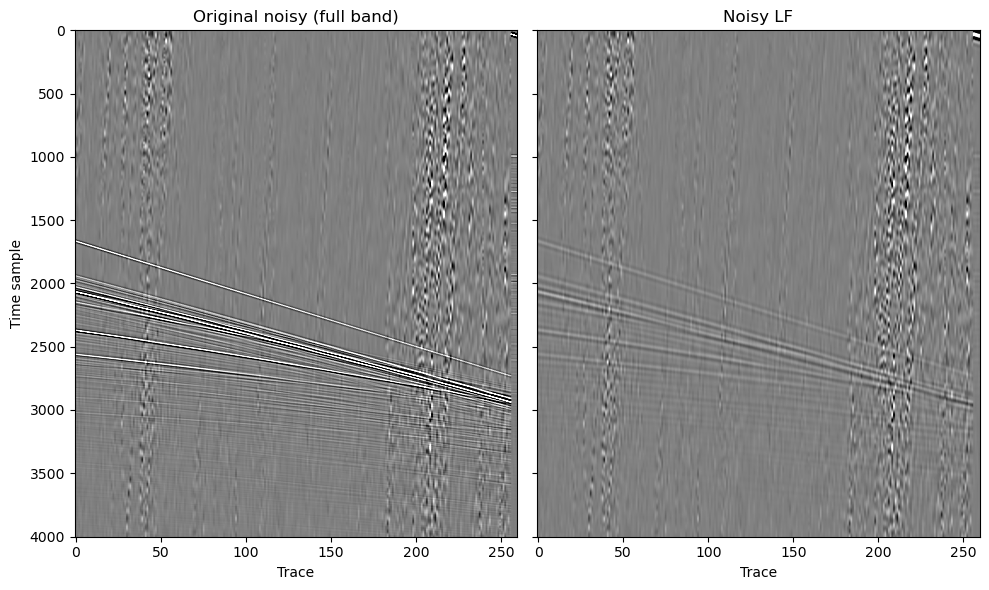

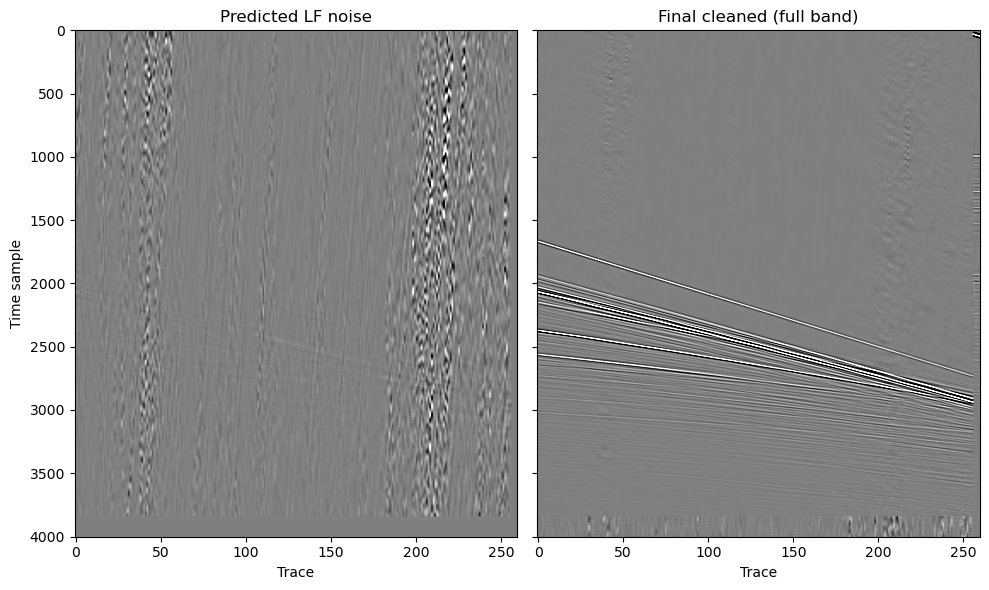

In [137]:
show_gathers_side_by_side(
    [noisy_full, noisy_full_LF],
    ["Original noisy (full band)", "Noisy LF"]
)
show_gathers_side_by_side(
    [noise_pred_LF, final_clean ],
    ["Predicted LF noise", "Final cleaned (full band)"]
)

### 5.6- Padding-based inference

#### P1 — Pad LF data (time only)

In [140]:
# Step P1 — Pad noisy_full_LF in time for inference

pad_t = pt  # safe padding length

noisy_full_LF_pad = np.pad(
    noisy_full_LF,
    pad_width=((0, 0), (0, pad_t)),  # (x, t)
    mode="edge"
)

print("Original shape:", noisy_full_LF.shape)
print("Padded shape  :", noisy_full_LF_pad.shape)


Original shape: (260, 4002)
Padded shape  : (260, 4514)


#### P2 — Allocate prediction buffers

In [142]:
nx, nt_pad = noisy_full_LF_pad.shape

noise_pred_LF_pad = np.zeros_like(noisy_full_LF_pad)
weight_pad = np.zeros_like(noisy_full_LF_pad)

stride_x = px // 2
stride_t = pt // 2


#### P3 — Sliding-window inference

In [144]:
model.eval()

with torch.no_grad():
    for x0 in range(0, nx - px + 1, stride_x):
        for t0 in range(0, nt_pad - pt + 1, stride_t):

            patch = noisy_full_LF_pad[x0:x0+px, t0:t0+pt]
            patch_t = torch.from_numpy(patch.copy()).float().unsqueeze(0).unsqueeze(0)

            pred = model(patch_t).cpu().numpy()[0, 0]

            noise_pred_LF_pad[x0:x0+px, t0:t0+pt] += pred
            weight_pad[x0:x0+px, t0:t0+pt] += 1.0


#### P4 — Normalize & CUT padding

In [146]:
# Normalize
weight_pad[weight_pad == 0] = 1.0
noise_pred_LF_pad /= weight_pad

# Cut padded portion BEFORE subtraction
noise_pred_LF_pad_cut = noise_pred_LF_pad[:, :noisy_full_LF.shape[1]]

print("Cut prediction shape:", noise_pred_LF_pad_cut.shape)


Cut prediction shape: (260, 4002)


#### P5 — Reconstruct final cleaned data

In [148]:
clean_pred_LF_pad = noisy_full_LF - noise_pred_LF_pad_cut

final_clean_pad = noisy_full - noisy_full_LF + clean_pred_LF_pad


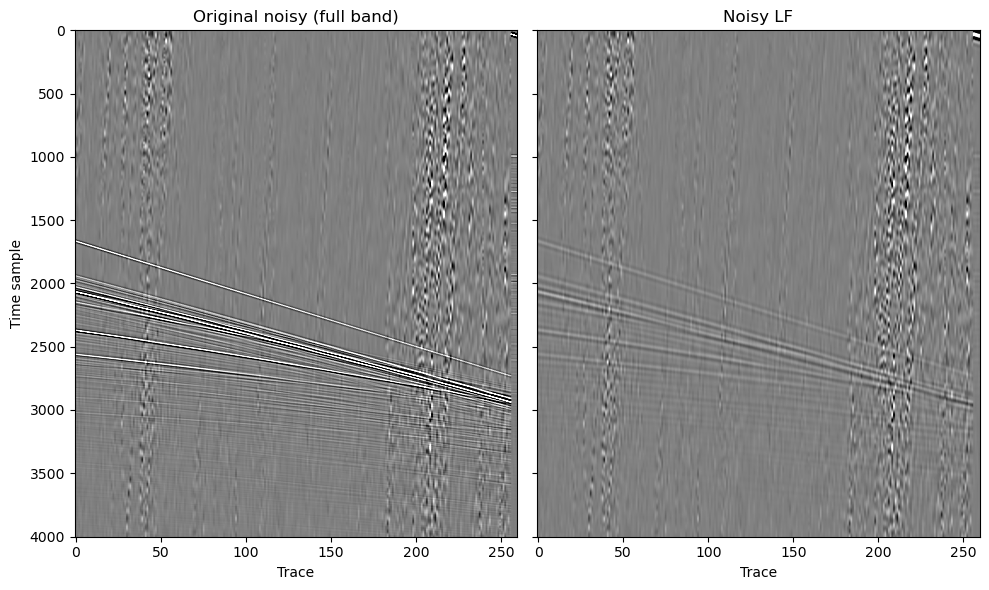

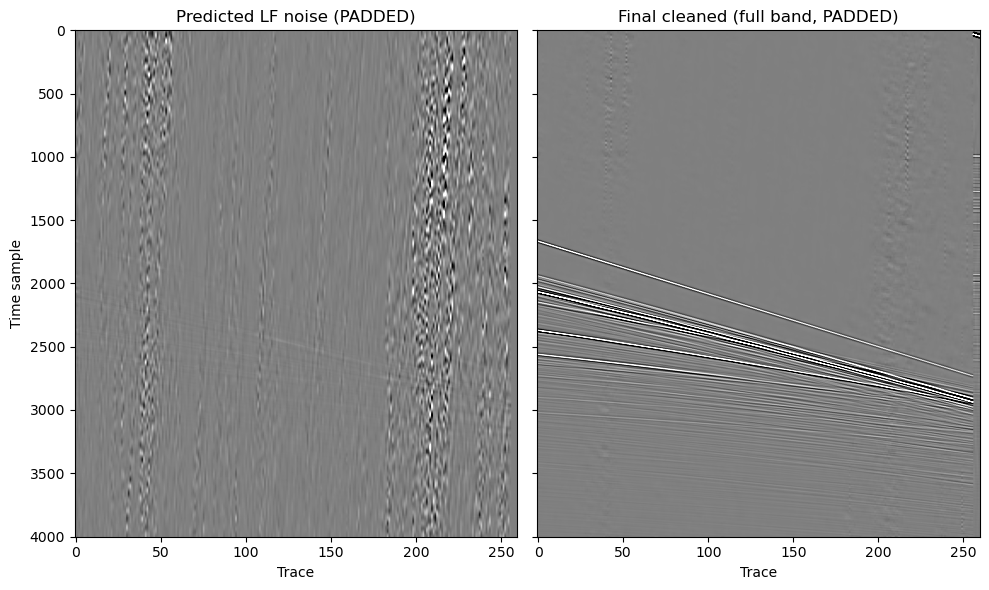

In [149]:
show_gathers_side_by_side(
    [noisy_full, noisy_full_LF],
    ["Original noisy (full band)", "Noisy LF"]
)
show_gathers_side_by_side(
    [noise_pred_LF_pad_cut, final_clean_pad ],
    ["Predicted LF noise (PADDED)", "Final cleaned (full band, PADDED)"]
)

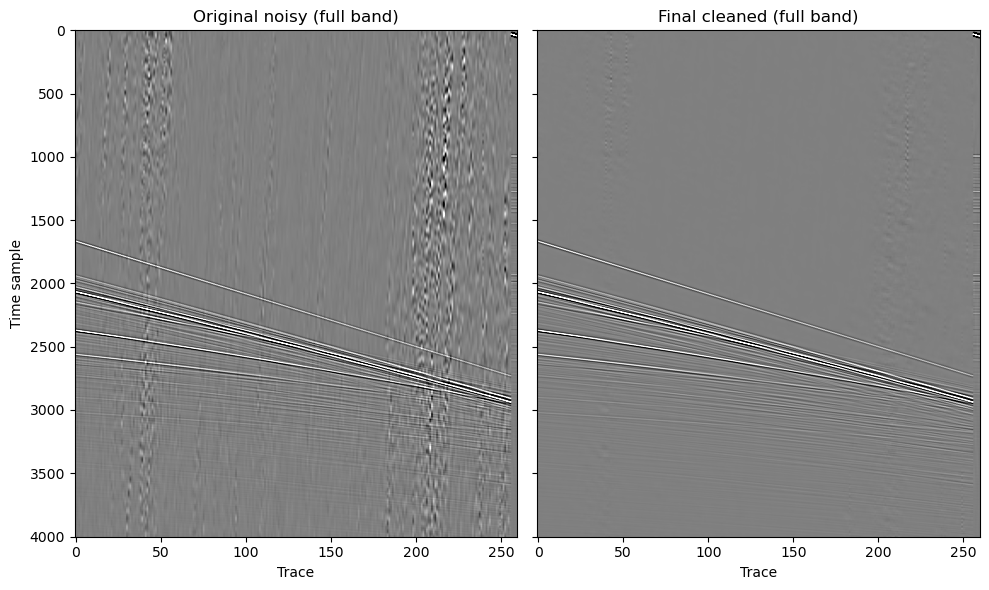

In [224]:
show_gathers_side_by_side(
    [noisy_full,final_clean_pad ],
    ["Original noisy (full band)", "Final cleaned (full band)"]
)

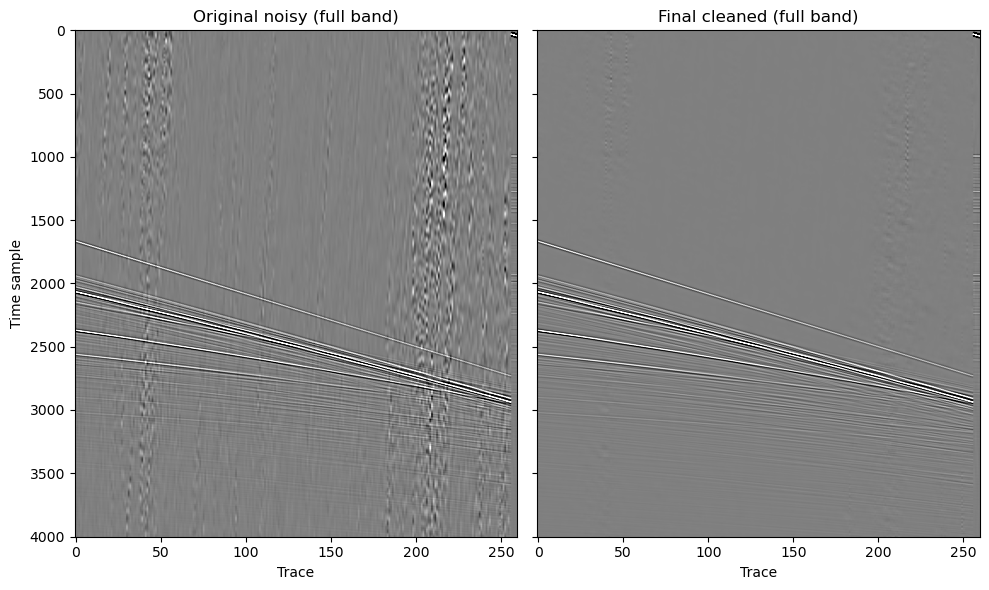

In [232]:
show_gathers_side_by_side(
    [noisy_full, final_clean_pad],
    ["Original noisy (full band)", "Final cleaned (full band)"],
    save_path="qc_before_and_after_ML_swell_att.png"
)
